# Rosetta Stone Arab-D Petrophysical Data


### Load Python requirements

In [1]:
from pandas import DataFrame, read_csv

import altair as alt
#alt.renderers.enable('altair_viewer')

import pandas as pd
import numpy as np
import altair_transform

#read the file
file = r'Pc_Results.xlsx'
df = pd.read_excel(file,index_col=False)


### Data:

Clerke's Rosetta Stone Arab-D carbonate data(1) is show below in the display of our data. This is Core analysis data. The Permeability (and log10 of perm lPerm) and Porosity are from the routine core analysis data. Clerke masterfully selected this dataset starting from thousands of qualified, inspected plug samples where the final samples were randomly selected from the group to create a very unique in that covers the full range in poro-perm space and Petrophysical Rock Types (PRTs). 

High Pressure Mercury Injection (HPMI) was performed on each of the core plug samples too. The HPMI data was fit to the Thomeer hyperbolas for each pore system giving us the Thomeer parameters Pd, G and Bulk Volume Occupied for each pore system found in the plug sample.






1) Clerke, E. A., Mueller III, H. W., Phillips, E. C., Eyvazzadeh, R. Y., Jones, D. H., Ramamoorthy, R., Srivastava, A., (2008) “Application of Thomeer Hyperbolas to decode the pore systems, facies and reservoir properties of the Upper Jurassic Arab D Limestone, Ghawar field, Saudi Arabia: A Rosetta Stone approach”, GeoArabia, Vol. 13, No. 4, p. 113-160, October, 2008. 

In [2]:
df.head(20)

,Sample,Permeability,lPerm,Porosity,PRT,ROCK_INDEX,G1,PD1,G2,PD2,...,Mode,lMode,Reference_Set,Pc,lPc,BVOCC,lBVOCC,dBv,Microns,lMicrons
0,1,1007.0000,3.003029,0.23883,M_1,1,1.02,1.10,0.45,120.0,...,30.099804,1.478564,Rosetta,1.61,0.206826,0.042171,-1.374982,0.000000,131.677019,2.11951
1,1,1007.0000,3.003029,0.23883,M_1,1,1.02,1.10,0.45,120.0,...,30.099804,1.478564,Rosetta,3.22,0.507856,2.196159,0.341664,2.153988,65.838509,1.81848
2,1,1007.0000,3.003029,0.23883,M_1,1,1.02,1.10,0.45,120.0,...,30.099804,1.478564,Rosetta,6.44,0.808886,5.173410,0.713777,2.977251,32.919255,1.51745
3,1,1007.0000,3.003029,0.23883,M_1,1,1.02,1.10,0.45,120.0,...,30.099804,1.478564,Rosetta,12.88,1.109916,7.520490,0.876246,2.347080,16.459627,1.21642
4,1,1007.0000,3.003029,0.23883,M_1,1,1.02,1.10,0.45,120.0,...,30.099804,1.478564,Rosetta,25.76,1.410946,9.274642,0.967297,1.754152,8.229814,0.91539
5,1,1007.0000,3.003029,0.23883,M_1,1,1.02,1.10,0.45,120.0,...,30.099804,1.478564,Rosetta,51.52,1.711976,10.605605,1.025535,1.330964,4.114907,0.61436
6,1,1007.0000,3.003029,0.23883,M_1,1,1.02,1.10,0.45,120.0,...,30.099804,1.478564,Rosetta,103.04,2.013006,11.641001,1.065990,1.035396,2.057453,0.31333
7,1,1007.0000,3.003029,0.23883,M_1,1,1.02,1.10,0.45,120.0,...,30.099804,1.478564,Rosetta,206.08,2.314036,13.109058,1.117571,1.468057,1.028727,0.01230
8,1,1007.0000,3.003029,0.23883,M_1,1,1.02,1.10,0.45,120.0,...,30.099804,1.478564,Rosetta,412.16,2.615066,15.024561,1.176802,1.915504,0.514363,-0.28873
9,1,1007.0000,3.003029,0.23883,M_1,1,1.02,1.10,0.45,120.0,...,30.099804,1.478564,Rosetta,824.32,2.916096,16.246106,1.210749,1.221544,0.257182,-0.58976


### Thomeer Parameters and Petrophysical Rock Types:

A Thomeer hyperbola is fit to the HPMI data by optimizing on the Thomeer Parameters G1, Pd1 and BV1 for the first pore system and G2, Pd2 and BV2 for the second. The following image relates the Thomeer hyperbola (dashed black line) to the Capillary Pressure Curve (solid red line). Ed Clerke used hist famous Thomeer Parameter spreadsheet with solver to determine the correct set of Thomeer parameters for each sample.  

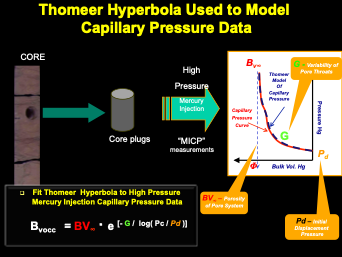

After all the Thomeer parameters were assigned to all the samples, then Ed used the distributions of the the Initial Displacement Pressure (Pd) to devise his Petrophysical Rock Types (PRT) scheme. 

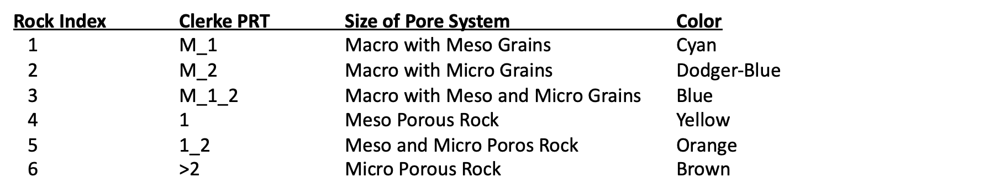


The following are some example results using Altair where the data in cross plots can be selected and then the appropriate data for those selected samples are shown in the bar charts below the cross plots. 

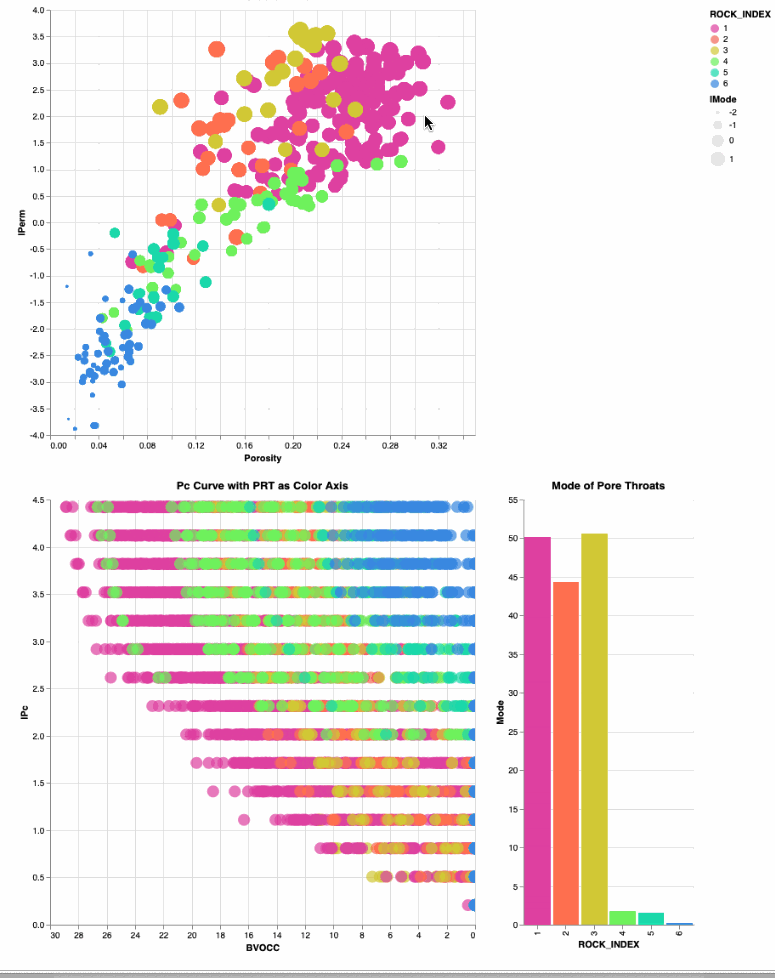


### Altair Interactivity starts with the Porosity - Permeability Cross Plot
#### The Porosity-Permebility Cross Plot with Petrophysical Rock Types (PRT) on z color axis as defined by Clerke:
Test the inteactive aspects of Altair by selecting data points from the cross plot and observe the Pc curves associated with the selected points on the lower plot. 

In [28]:
#interval = alt.selection_interval()
#vega.scheme('basic', ['#f00', '#0f0', '#00f', '#ff0', '#f0f', '#0ff']);
interval = alt.selection_interval()


kphi = alt.Chart(df).mark_point(filled=True, size=200).encode(
    x='Porosity:Q',
    y='lPerm:Q',
    size='lMode:Q',
    color=alt.condition(interval, 'ROCK_INDEX:O', alt.value('lightgray'),scale=alt.Scale(scheme='rainbow')),
    #color=alt.condition(selector, 'Well_Name:O', alt.value('lightgray'), legend=None),
    tooltip='Mode:Q', 
).properties(
    width=500,
    height=500, 

    title='PRT as Color Axis',
    selection=interval
)

pc = alt.Chart(df).mark_point(filled=True, size=200,clip=True).encode(
    alt.X('BVOCC:Q',
        scale=alt.Scale(domain=(30, 0))
    ),    
    y='lPc:Q',
    #size='lMode:Q',
    color=alt.condition(interval, 'ROCK_INDEX:O', alt.value('lightgray'),scale=alt.Scale(scheme='rainbow')),
    #color=alt.condition(selector, 'Well_Name:O', alt.value('lightgray'), legend=None),
    tooltip='Mode:Q', 
    #strokeDash='Sample',
).properties(
    title='Pc Curve with PRT as Color Axis',
    width=500,
    height=500, 
    
).transform_filter(
    interval
)


    




hist2 = alt.Chart(df).mark_bar().encode(
    x='ROCK_INDEX:O',
    y='Mode:Q',
    color=alt.condition(interval, 'ROCK_INDEX:O', alt.value('lightgray'),scale=alt.Scale(scheme='rainbow'))
).properties(
    title='Mode of Pore Throats',
    width=200,
    height=500,
    #selection=interval
).transform_filter(
    interval
)

kphihist = kphi | hist2
pchist = pc 


kphihist & pchist


alt.VConcatChart(...)

## Create an Upscaled Pc curve from Selected Samples

In [27]:
#interval = alt.selection_interval()
#vega.scheme('basic', ['#f00', '#0f0', '#00f', '#ff0', '#f0f', '#0ff']);
interval = alt.selection_interval()


kphi = alt.Chart(df).mark_point(filled=True, size=200).encode(
    x='Porosity:Q',
    y='lPerm:Q',
    size='lMode:Q',
    color=alt.condition(interval, 'ROCK_INDEX:O', alt.value('lightgray'),scale=alt.Scale(scheme='rainbow')),
    #color=alt.condition(selector, 'Well_Name:O', alt.value('lightgray'), legend=None),
    tooltip='Mode:Q', 
).properties(
    width=500,
    height=500, 

    title='PRT as Color Axis',
    selection=interval
)

pc = alt.Chart(df).mark_point(filled=True, size=200,clip=True).encode(
    alt.X('BVOCC:Q',
        scale=alt.Scale(domain=(30, 0))
    ),    
    y='lPc:Q',
    #size='lMode:Q',
    color=alt.condition(interval, 'ROCK_INDEX:O', alt.value('lightgray'),scale=alt.Scale(scheme='rainbow')),
    #color=alt.condition(selector, 'Well_Name:O', alt.value('lightgray'), legend=None),
    tooltip='Mode:Q', 
    #strokeDash='Sample',
).properties(
    title='Upscaled Pc Curve with all Selected Pc Curves. PRT as Color Axis.',
    width=500,
    height=500, 
    
).transform_filter(
    interval
)




pc2 = alt.Chart(df).mark_line().encode(
    alt.X('BVOCC:Q', aggregate='mean',
          scale=alt.Scale(domain=(30, 0))
         ),
    alt.Y('lPc:Q'),
    #color=alt.condition(interval, 'ROCK_INDEX:O', alt.value('lightgray'),scale=alt.Scale(scheme='rainbow')), 
).properties(
    title='Upscaled Pc Curve with PRT as Color Axis',
    width=500,
    height=500, 
    
).transform_filter(
    interval
)
    
    
    




hist2 = alt.Chart(df).mark_bar().encode(
    x='ROCK_INDEX:O',
    y='Mode:Q',
    color=alt.condition(interval, 'ROCK_INDEX:O', alt.value('lightgray'),scale=alt.Scale(scheme='rainbow'))
).properties(
    title='Mode of Pore Throats',
    width=200,
    height=500,
    #selection=interval
).transform_filter(
    interval
)

kphihist = kphi | hist2
pchist = pc + pc2


kphihist & pchist


alt.VConcatChart(...)

### More Example Plots with Interactivity:

In [5]:

interval = alt.selection_interval()

base = alt.Chart(df).properties(
    width=500,
    height=500, 
).add_selection(interval)



kphi = base.mark_point(filled=True, size=200).encode(
    x='Porosity:Q',
    y='lPerm:Q',
    size='lMode:Q',
    color=alt.condition(interval, 'ROCK_INDEX:O', alt.value('lightgray'),scale=alt.Scale(scheme='rainbow')),
    #color=alt.condition(selector, 'Well_Name:O', alt.value('lightgray'), legend=None),
    tooltip='Mode:Q', 
).properties(
    title='PRT as Color Axis',
    selection=interval
)



pc = base.mark_point( filled = True, size=200, clip=True ).encode(
    alt.X('lBVOCC:Q',
        scale=alt.Scale(domain=(2, -2.5))
    ),    
    y='lPc:Q',
    #size='lMode:Q',
    color=alt.condition(interval, 'ROCK_INDEX:O', alt.value('lightgray'),scale=alt.Scale(scheme='rainbow')),
    #color=alt.condition(selector, 'Well_Name:O', alt.value('lightgray'), legend=None),
    #strokeDash='Sample',
    tooltip='Mode:Q', 
).properties(
    title='Pc Curve with PRT as Color Axis',
    width=500,
    height=500, 
    
).transform_filter(
    interval
)

box = alt.Chart(df).mark_boxplot(extent='min-max').encode(
    x='ROCK_INDEX:O',
    y='lMode:Q',
    color=alt.condition(interval, 'ROCK_INDEX:O', alt.value('lightgray'),scale=alt.Scale(scheme='rainbow')),
).properties(
    title='Box Plot by PRT ',
    width=200,
    height=500, 
    
).transform_filter(
    interval
)




ptd = base.mark_line(filled = True, size=200, clip=True).encode(
    alt.X('lMicrons:Q',
        scale=alt.Scale(domain=(-2, 2.5))
    ),    
    alt.Y('dBv:Q',
        scale=alt.Scale(domain=(0, 15))
    ),    
    size='lMode:Q',
    color=alt.condition(interval, 'ROCK_INDEX:O', alt.value('lightgray'),scale=alt.Scale(scheme='rainbow')),
    #color=alt.condition(selector, 'Well_Name:O', alt.value('lightgray'), legend=None),
    tooltip='Mode:Q', 
).properties(
    title='PRT as Color Axis',
    #selection=interval
).transform_filter(
    interval
)



hist2 = alt.Chart(df).mark_bar().encode(
    x='ROCK_INDEX:O',
    y='lMode:Q',
    color=alt.condition(interval, 'ROCK_INDEX:O', alt.value('lightgray'),scale=alt.Scale(scheme='rainbow'))
).properties(
    title='Mode of Pore Throats',
    width=200,
    height=500,
    #selection=interval
).transform_filter(
    interval
)


kphibox = kphi | box

ptdhist = ptd | hist2


kphibox & ptdhist

alt.VConcatChart(...)